In [1]:
import tensorflow as tf
import keras
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
from keras.models import load_model

model = load_model('facenet_keras.h5')
print(model.inputs)
print(model.outputs)

from os import listdir
from os.path import isdir
from PIL import Image
from matplotlib import pyplot
from numpy import savez_compressed
from numpy import asarray
from mtcnn.mtcnn import MTCNN
import mtcnn
import os
import cv2
import datetime
from numpy import load
from numpy import expand_dims
from keras.models import load_model
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC
from numpy import savez_compressed
from tqdm import tqdm  

print(mtcnn.__version__)

Num GPUs Available:  1
[<KerasTensor: shape=(None, 160, 160, 3) dtype=float32 (created by layer 'input_1')>]
[<KerasTensor: shape=(None, 128) dtype=float32 (created by layer 'Bottleneck_BatchNorm')>]
0.1.0


### Constant Variables, Adjust for threshold of interest

In [2]:
#Variables
face_confidence_threshold = 0.988
face_recognition_probability = 0.2

### Helper Methods

In [3]:
#Convert ms to s. round s to nearest 0.5
def roundToSec(milli):
    second = milli/1000
    decimal = second - int(second)
    if decimal < 0.3:
        final_seconds = int(second)
    elif decimal < 0.8:
        final_seconds = int(second) + 0.5
    else:
        final_seconds = int(second) + 1
    return final_seconds

#Convert ms to HH:MM:SS format
def msToTimeFormat(millis):
    seconds = millis/1000
    hours = seconds // (60*60)
    seconds %= (60*60)
    minutes = seconds // 60
    seconds %= 60
    return "%02i:%02i:%02i" % (hours, minutes, seconds)
    
#Given an image, return all faces. Return faces only above confidence threshold
def extract_face2(pixels, required_size=(160, 160)):

    detector = MTCNN()
    # detect faces in the image
    results = detector.detect_faces(pixels)
    
    face_list = []
    confidence = []
    
    for r in results:
        # extract the bounding box from the first face
        x1, y1, width, height = r['box']
        # bug fix
        x1, y1 = abs(x1), abs(y1)
        x2, y2 = x1 + width, y1 + height
        # extract the face
        face = pixels[y1:y2, x1:x2]
        # resize pixels to the model size
        image = Image.fromarray(face)
        image = image.resize(required_size)
        face_array = asarray(image)
        face_list.append(face_array)
        confidence.append(r['confidence'])
    
    final_face_list = []
    for i in range(len(confidence)):
        if confidence[i] >= face_confidence_threshold:
            final_face_list.append(face_list[i])
    
    return final_face_list

#Given list of faces, plot all the faces
def plot_faces(face_list):
    for face in (face_list):
        pyplot.figure()
        pyplot.imshow(face)

# extract a single face from a given photograph
def extract_face(filename, required_size=(160, 160)):
    # load image from file
    image = Image.open(filename)
    # convert to RGB, if needed
    image = image.convert('RGB')
    # convert to array
    pixels = asarray(image)
    # create the detector, using default weights
    detector = MTCNN()
    # detect faces in the image
    results = detector.detect_faces(pixels)
    # extract the bounding box from the first face
    x1, y1, width, height = results[0]['box']
    # bug fix
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height
    # extract the face
    face = pixels[y1:y2, x1:x2]
    # resize pixels to the model size
    image = Image.fromarray(face)
    image = image.resize(required_size)
    face_array = asarray(image)
    return face_array

def load_faces(directory):
    faces = list()
    # enumerate files
    for filename in tqdm(listdir(directory)):
        # path
        path = directory + filename
        # get face
        face = extract_face(path)
        # store
        faces.append(face)
    return faces

# load a dataset that contains one subdir for each class that in turn contains images
def load_dataset(directory):
    X, y = list(), list()
    # enumerate folders, on per class
    for subdir in (listdir(directory)):
        # path
        path = directory + subdir + '/'
        # skip any files that might be in the dir
        if not isdir(path):
            continue
        # load all faces in the subdirectory
        faces = load_faces(path)
        # create labels
        labels = [subdir for _ in range(len(faces))]
        # summarize progress
        print('>loaded %d examples for class: %s' % (len(faces), subdir))
        # store
        X.extend(faces)
        y.extend(labels)
    
    return asarray(X), asarray(y)

# get the face embedding for one face
def get_embedding(model, face_pixels):
    # scale pixel values
    face_pixels = face_pixels.astype('float32')
    # standardize pixel values across channels (global)
    mean, std = face_pixels.mean(), face_pixels.std()
    face_pixels = (face_pixels - mean) / std
    # transform face into one sample
    samples = expand_dims(face_pixels, axis=0)
    # make prediction to get embedding
    yhat = model.predict(samples)
    return yhat[0]

# Train Face Model

### Import training data from files. Train the model. 

In [4]:
# load train dataset
testfolder = "Face Pictures 3"
trainX, trainy = load_dataset(testfolder +'/train/')
print(trainX.shape, trainy.shape)


# load the facenet model
model = load_model('facenet_keras.h5')
print('Loaded Model')
# convert each face in the train set to an embedding
newTrainX = list()
for face_pixels in trainX:
    embedding = get_embedding(model, face_pixels)
    newTrainX.append(embedding)
newTrainX = asarray(newTrainX)
print(newTrainX.shape)
trainX = newTrainX

# normalize input vectors
in_encoder = Normalizer(norm='l2')
trainX = in_encoder.transform(trainX)

# label encode targets, need to convert string labels into integers
out_encoder = LabelEncoder()
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)

# fit model
model2 = SVC(kernel='linear', probability=True)
model2.fit(trainX, trainy)

 17%|█▋        | 1/6 [00:07<00:38,  7.67s/it]

100%|██████████| 6/6 [00:15<00:00,  2.58s/it]


>loaded 6 examples for class: Aufnun


100%|██████████| 4/4 [00:05<00:00,  1.39s/it]


>loaded 4 examples for class: Jeff


100%|██████████| 13/13 [00:21<00:00,  1.64s/it]


>loaded 13 examples for class: Kam


100%|██████████| 13/13 [00:19<00:00,  1.50s/it]


>loaded 13 examples for class: Konark


100%|██████████| 2/2 [00:03<00:00,  1.66s/it]


>loaded 2 examples for class: Lawrence


100%|██████████| 7/7 [00:09<00:00,  1.42s/it]


>loaded 7 examples for class: Mark


100%|██████████| 5/5 [00:07<00:00,  1.45s/it]


>loaded 5 examples for class: Nitesh


100%|██████████| 11/11 [00:15<00:00,  1.44s/it]


>loaded 11 examples for class: Shahmir


100%|██████████| 445/445 [07:14<00:00,  1.02it/s]


>loaded 445 examples for class: z Random Person
(506, 160, 160, 3) (506,)
Loaded Model
(506, 128)


SVC(kernel='linear', probability=True)

# Reading Video file

### Reading video file by frame, reading a frame every 0.5 seconds


In [5]:
xFaces, yLabel = list(), list()
face_list = list()

# Create an object to read
# from camera
video = cv2.VideoCapture("Test Video/NewNickyRomero.mp4")

# We need to check if camera
# is opened previously or not
if (video.isOpened() == False):
    print("Error reading video file")
    
# We need to set resolutions.
# so, convert them from float to integer.
frame_width = int(video.get(3))
frame_height = int(video.get(4))

size = (frame_width, frame_height)

frame_num = 0
prev_time = -1
while True:
    ret, frame = video.read()
    frame_num += 1
    if frame_num%1000 == 0:
        print(frame_num)
        print(msToTimeFormat(video.get(cv2.CAP_PROP_POS_MSEC)))
    
    if ret == True:
        
        #Calculate time and check if it was the same as before. Skip if it same as before
        time_ms = video.get(cv2.CAP_PROP_POS_MSEC)
        time_s = roundToSec(time_ms)
        if time_s == prev_time:
            continue
        prev_time = time_s

        #Convert BGR to RGB (otherwise pics in blue)
        im_rgb = frame[:, :, [2, 1, 0]]
        frame = im_rgb.copy()

        #Display Image from video reader
        #title = time_s
        #pyplot.figure()
        #pyplot.title(title) #Displays title on image
        #pyplot.imshow(frame)
    
        #Extract Face
        faces = extract_face2(frame)
        
        #Append to face array and label array
        timestamp = msToTimeFormat(int(time_ms))
        for f in faces:
            face_list.append(f)
            yLabel.append(timestamp)
        
        #Plot Face
        #plot_faces(faces)
    
    else:
        #Break the loop
        break

        
video.release()
cv2.destroyAllWindows()

print('Number of frames: ', frame_num)
print('Done!')
print('Extracted', len(face_list), 'numbers of faces')

#Convert Lists
xFaces.extend(face_list)
xFaces = asarray(xFaces)
yLabel = asarray(yLabel)



1000
00:00:33
2000
00:01:06
3000
00:01:40
4000
00:02:13
5000
00:02:46
6000
00:03:20
7000
00:03:53
8000
00:04:26
9000
00:05:00
10000
00:05:33
11000
00:06:06
12000
00:06:40
13000
00:07:13
14000
00:07:47
15000
00:08:20
16000
00:08:53
17000
00:09:27
18000
00:10:00
19000
00:10:33
20000
00:11:07
21000
00:11:40
22000
00:12:14
23000
00:12:47
24000
00:13:20
25000
00:13:54
26000
00:14:27
27000
00:15:00
28000
00:15:34
29000
00:16:07
30000
00:16:40
31000
00:17:14
32000
00:17:47
33000
00:18:21
34000
00:18:54
35000
00:19:27
36000
00:20:01
37000
00:20:34
38000
00:21:07
39000
00:21:41
40000
00:22:14
41000
00:22:47
42000
00:23:21
43000
00:23:54
44000
00:24:28
45000
00:25:01
46000
00:25:34
47000
00:26:08
48000
00:26:41
49000
00:27:14
50000
00:27:48
51000
00:28:21
52000
00:28:55
53000
00:29:28
54000
00:30:01
55000
00:30:35
56000
00:31:08
57000
00:31:41
58000
00:32:15
59000
00:32:48
60000
00:33:21
61000
00:33:55
62000
00:34:28
63000
00:35:02
64000
00:35:35
65000
00:36:08
66000
00:36:42
67000
00:37:15
6800

# Predict Data

### Run test data through model to predict faces

In [6]:
print(xFaces.shape, yLabel.shape)

(12718, 160, 160, 3) (12718,)


C:\Users\Conda\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


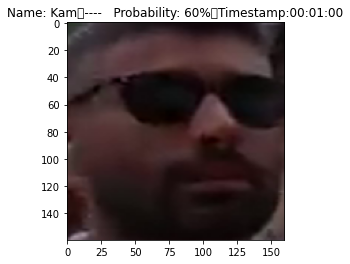

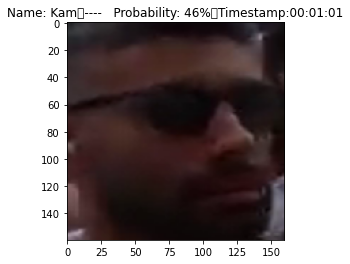

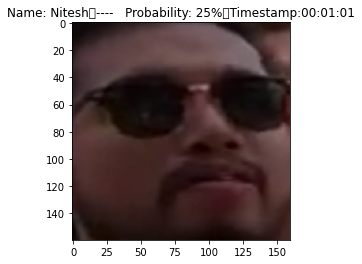

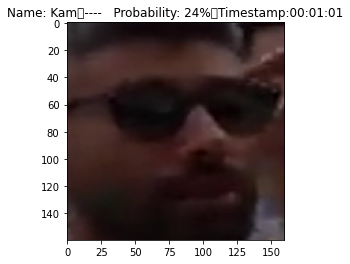

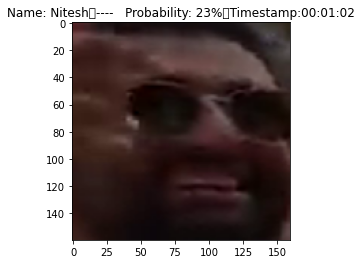

...

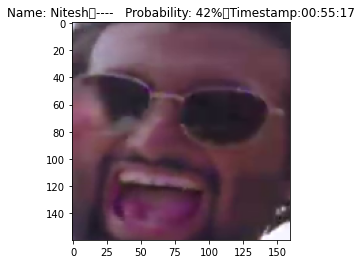

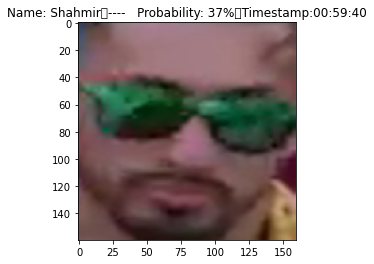

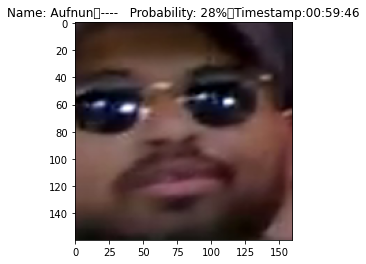

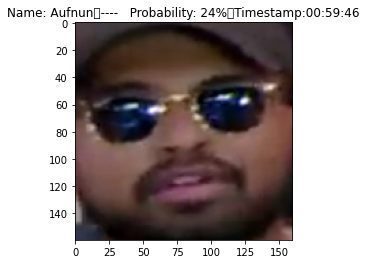

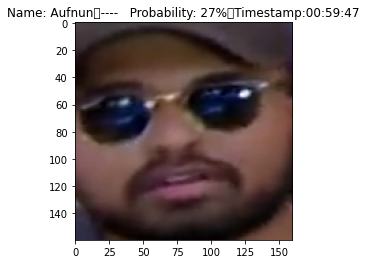

In [7]:
#Prepare test data for model
# convert each face in the test set to an embedding
newTestX = list()
for face_pixels in xFaces:
    embedding = get_embedding(model, face_pixels)
    newTestX.append(embedding)
newTestX = asarray(newTestX)
newTestX = in_encoder.transform(newTestX)

#Predict data using model
test_encodednames = model2.predict(newTestX)
test_prob = model2.predict_proba(newTestX)
test_names = out_encoder.inverse_transform(test_encodednames)


#Set for boys
Boys = set(('Nitesh', 'Aufnun', 'Mark', 'Jeff', "Lawrence", 'Kam', 'Konark', 'Shahmir'))

for i in range(len(test_prob)):
    probability = test_prob[i][test_encodednames[i]]
    
    #Check if face is in "Boys" and probability is > threshold
    if test_names[i] in Boys and probability > face_recognition_probability:
    
        title = 'Name: '+ str(test_names[i]) + '\t----   Probability: '+ str(int(probability*100)) + '%' + '\tTimestamp:' + yLabel[i]
        face_pixels = xFaces[i]
        pyplot.imshow(face_pixels)
        pyplot.title(title)
        pyplot.show()


In [10]:
savez_compressed('FullTest1part2.npz', test_encodednames, test_prob, test_names)